In [3]:
import pandas as pd
import gensim
import nltk

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df=pd.read_csv("/content/drive/MyDrive/DL/emails.csv")
df

,text,spam
0,Subject: naturally irresistible your corporate...,1
1,Subject: the stock trading gunslinger fanny i...,1
2,Subject: unbelievable new homes made easy im ...,1
3,Subject: 4 color printing special request add...,1
4,"Subject: do not have money , get software cds ...",1
...,...,...
5723,Subject: re : research and development charges...,0
5724,"Subject: re : receipts from visit jim , than...",0
5725,Subject: re : enron case study update wow ! a...,0
5726,"Subject: re : interest david , please , call...",0


In [5]:
df

,text,spam
0,Subject: naturally irresistible your corporate...,1
1,Subject: the stock trading gunslinger fanny i...,1
2,Subject: unbelievable new homes made easy im ...,1
3,Subject: 4 color printing special request add...,1
4,"Subject: do not have money , get software cds ...",1
...,...,...
5723,Subject: re : research and development charges...,0
5724,"Subject: re : receipts from visit jim , than...",0
5725,Subject: re : enron case study update wow ! a...,0
5726,"Subject: re : interest david , please , call...",0


In [6]:
df['spam'].value_counts()

0    4360
1    1368
Name: spam, dtype: int64

In [7]:
df.drop_duplicates(inplace=True)

In [8]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [9]:
from nltk.corpus import stopwords
stop=stopwords.words('english')

In [10]:
import re
def remove_specialChar(x):
    text=re.sub(r"http\S+", "", x)
    text=re.sub('[^A-Za-z0-9]+', ' ',text)
    return text

In [11]:
def remove_stopwords(data):
    data=data.split()
    a=[]
    for i in data:
        if i not in stop:
            a.append(i)
    return " ".join(a)

In [12]:
df['text']=df['text'].apply(lambda x:x.lower())

In [13]:
df['text']=df['text'].apply(remove_specialChar)
df['text']=df['text'].apply(remove_stopwords)

In [14]:
y=df.drop(columns=['text'])
y

,spam
0,1
1,1
2,1
3,1
4,1
...,...
5723,0
5724,0
5725,0
5726,0


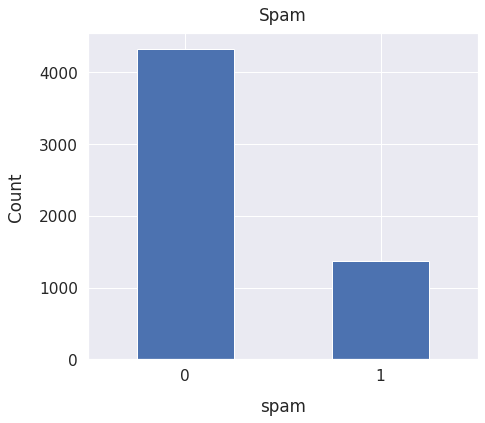

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=1.4)
df['spam'].value_counts().plot(kind="bar" , figsize=(7, 6), rot=0)
plt.xlabel("spam", labelpad=14)
plt.ylabel("Count", labelpad=14)
plt.title("Spam", y=1.02);

# **WORDCLOUD**

In [21]:
spam=df[df['spam']==1]
not_spam=df[df['spam']==0]

In [22]:
def for_wordCloud(data):
  fully_modify=[]
  for i in data['text']:
      for w in i.split():
          fully_modify.append(w)
  return " ".join(fully_modify)

In [26]:
spam_text=for_wordCloud(spam)
notspam_text=for_wordCloud(not_spam)

In [27]:
from wordcloud import WordCloud

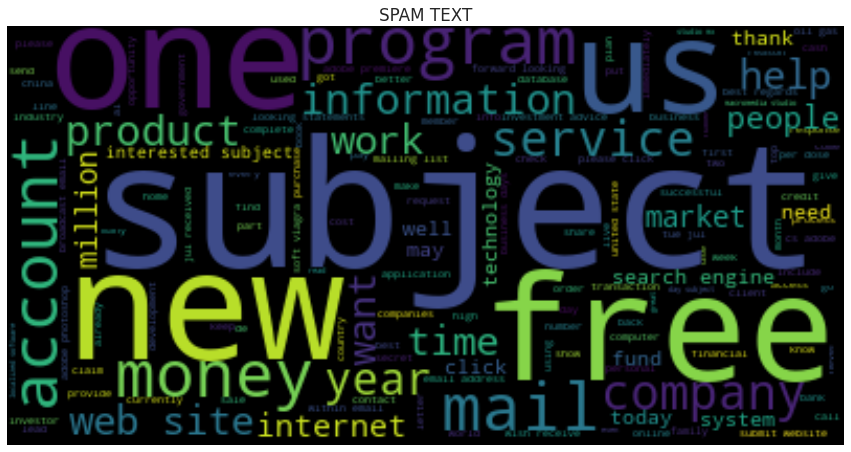

In [29]:
word_cloud = WordCloud(collocations = True, background_color = 'black').generate(spam_text)
# Display the generated Word Cloud
plt.figure(figsize=(15,9))
plt.imshow(word_cloud, interpolation='bilinear')
plt.title("SPAM TEXT")
plt.axis("off")
plt.show()

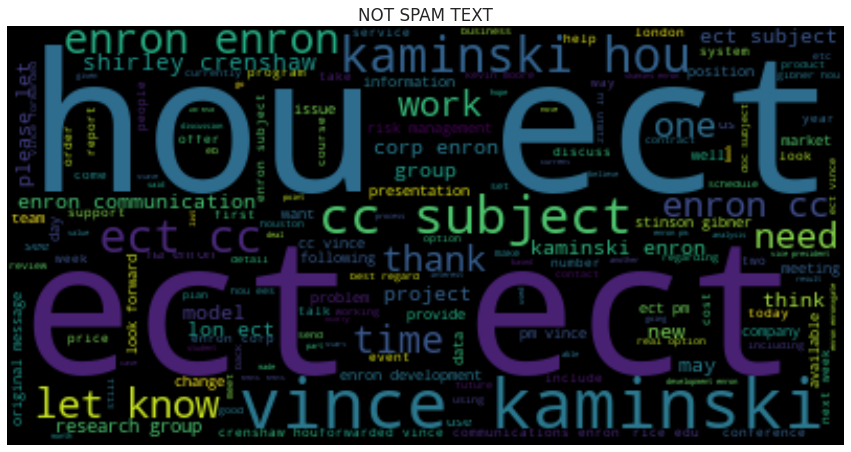

In [30]:
word_cloud = WordCloud(collocations = True, background_color = 'black').generate(notspam_text)
# Display the generated Word Cloud
plt.figure(figsize=(15,9))
plt.imshow(word_cloud, interpolation='bilinear')
plt.title("NOT SPAM TEXT")
plt.axis("off")
plt.show()

# **Preparation for Word2vec**

In [31]:
df=df[['text']]
df

,text
0,subject naturally irresistible corporate ident...
1,subject stock trading gunslinger fanny merrill...
2,subject unbelievable new homes made easy im wa...
3,subject 4 color printing special request addit...
4,subject money get software cds software compat...
...,...
5723,subject research development charges gpg forwa...
5724,subject receipts visit jim thanks invitation v...
5725,subject enron case study update wow day super ...
5726,subject interest david please call shirley cre...


In [32]:
from nltk import sent_tokenize
from gensim.utils import simple_preprocess       # use gensim method for simple preprocess 
story=[]                                         # in story we store all tokenize words of each row as a list
for data in df['text']:                          # easy to find total number of words in corpus
    raw_sent=sent_tokenize(data)
    for raw in raw_sent:
        story.append((simple_preprocess(raw)))

In [33]:
story

[['subject',
  'naturally',
  'irresistible',
  'corporate',
  'identity',
  'lt',
  'really',
  'hard',
  'recollect',
  'company',
  'market',
  'full',
  'suqgestions',
  'information',
  'isoverwhelminq',
  'good',
  'catchy',
  'logo',
  'stylish',
  'statlonery',
  'outstanding',
  'website',
  'make',
  'task',
  'much',
  'easier',
  'promise',
  'havinq',
  'ordered',
  'iogo',
  'company',
  'automaticaily',
  'become',
  'world',
  'ieader',
  'isguite',
  'ciear',
  'without',
  'good',
  'products',
  'effective',
  'business',
  'organization',
  'practicable',
  'aim',
  'hotat',
  'nowadays',
  'market',
  'promise',
  'marketing',
  'efforts',
  'become',
  'much',
  'effective',
  'list',
  'clear',
  'benefits',
  'creativeness',
  'hand',
  'made',
  'original',
  'logos',
  'specially',
  'done',
  'reflect',
  'distinctive',
  'company',
  'image',
  'convenience',
  'logo',
  'stationery',
  'provided',
  'formats',
  'easy',
  'use',
  'content',
  'management',

In [34]:
model=gensim.models.Word2Vec(        # gensim model for finding the feature vectors for each word
    window=10,                       # window size is 10 for finding the similarity
    min_count=4,                     # count only those sentences which have length >= 4
    size=300,                        # size of features vectors for each word
    workers=4,
)

In [35]:
model.build_vocab(story)

In [36]:
model.train(story,total_examples=model.corpus_count,epochs=model.epochs)   # by default epoch is 5

(3492447, 3875530)

In [37]:
model.wv.get_vector('service')    # now we can find vector for each word

array([-1.16600059e-01, -7.84100294e-01, -6.41497150e-02,  5.27441621e-01,
        3.81778717e-01, -9.17053148e-02,  6.45960391e-01,  5.94767392e-01,
       -6.03953183e-01, -2.55709663e-02, -4.62394238e-01, -6.69352770e-01,
       -4.58118707e-01,  5.17662428e-03, -3.40610355e-01,  2.08231941e-01,
       -7.04701424e-01,  1.38646334e-01, -1.23189524e-01, -3.06655020e-01,
        3.03446651e-01, -5.73110640e-01,  6.94181025e-01, -5.49092412e-01,
       -6.72188818e-01,  1.01438105e+00, -4.32517141e-01,  1.10258687e+00,
       -3.06151837e-01,  9.09314826e-02,  2.09139630e-01, -9.59585726e-01,
        2.18192518e-01, -2.05694020e-01, -1.54994234e-01, -3.88165593e-01,
       -3.92011642e-01,  8.53529394e-01, -9.49062109e-01, -1.17420495e-01,
       -9.37719822e-01, -3.75764757e-01,  7.76448131e-01, -8.77311677e-02,
        2.15442479e-02, -1.09938346e-01, -9.92719531e-01,  8.07693481e-01,
       -7.44040728e-01,  3.92547399e-01, -1.02824070e-01,  4.91395444e-02,
        2.23083407e-01, -

In [38]:
vocab=model.wv.vocab

In [39]:
len(vocab) # total number of words

12951

In [40]:
model.wv.most_similar("service")

[('bermuda', 0.8836526870727539),
 ('local', 0.8771777153015137),
 ('limited', 0.8720508813858032),
 ('customer', 0.8672734498977661),
 ('sales', 0.8625911474227905),
 ('stores', 0.8527775406837463),
 ('client', 0.8498737215995789),
 ('items', 0.8433811068534851),
 ('users', 0.8393852710723877),
 ('online', 0.8343840837478638)]

- Now creating a dictionary with words in vocab and their embeddings. This will be used when we will be creating embedding matrix (for feeding to keras embedding layer)

In [41]:
word_vec=model.wv.vocab
len(word_vec)

12951

In [42]:
len(word_vec) # total number of words

12951

In [43]:
word_vec=list(word_vec)

In [44]:
word_vec_dict={}                  # build dictionary key as a word, value as vectors
for word in word_vec:
  word_vec_dict[word]=model.wv.get_vector(word)
print("The no of key-value pairs : ",len(word_vec_dict)) # should come equal to vocab size
  

The no of key-value pairs :  12951


In [45]:
word_vec_dict

{'subject': array([ 1.77089766e-01, -1.34460437e+00,  4.03714776e-01, -1.10797882e-01,
        -1.58721435e+00,  8.13550949e-01, -1.34096098e+00,  2.43551537e-01,
         1.40864992e+00,  7.40614653e-01,  7.33000338e-01,  2.98046976e-01,
         7.06460655e-01,  4.45357740e-01, -6.39674485e-01, -9.38453496e-01,
        -5.30287288e-02, -7.36567736e-01, -1.82384253e+00, -5.04078090e-01,
        -1.35078609e+00,  2.26910639e+00, -8.44202638e-02,  1.05346584e+00,
        -6.20918795e-02, -5.21317840e-01,  1.09622824e+00, -1.35560799e+00,
         4.92415011e-01,  4.13289815e-01,  5.84857345e-01, -2.29937181e-01,
         3.48621696e-01,  2.01509714e-01,  7.34215558e-01,  1.68182269e-01,
         9.50636044e-02, -8.13641727e-01,  7.77306736e-01,  7.50909448e-01,
         5.54123282e-01, -5.93751967e-01, -7.66439617e-01,  1.89578474e-01,
         1.71249282e+00,  1.23688531e+00,  1.58992887e+00, -8.35976720e-01,
        -3.85891423e-02,  9.20323730e-02,  4.19926405e-01,  7.54083157e-01,
 

In [46]:
df.head()

,text
0,subject naturally irresistible corporate ident...
1,subject stock trading gunslinger fanny merrill...
2,subject unbelievable new homes made easy im wa...
3,subject 4 color printing special request addit...
4,subject money get software cds software compat...


In [47]:
maxi=-1
for i,txt in enumerate(df['text']):
    tokens=txt.split()
    if len(tokens)>maxi:
        maxi=len(tokens)
print(maxi)                  # means that in row that is 4331 is max token or words


4331


In [48]:

#keras
import keras
from keras.preprocessing.text import one_hot,Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense , Flatten ,Embedding,Input,CuDNNLSTM,LSTM
from keras.models import Model
from keras.preprocessing.text import text_to_word_sequence


In [49]:
tok=Tokenizer()
tok.fit_on_texts(df['text'])
vocab_size=len(tok.word_index)+1
encd_rev=tok.texts_to_sequences(df['text'])


In [50]:
import numpy as np
np.array(encd_rev)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


array([list([3, 5664, 12127, 408, 1651, 3769, 352, 784, 4269, 50, 59, 296, 6153, 25, 9043, 98, 4379, 721, 5915, 5916, 1556, 198, 63, 2030, 146, 1722, 1870, 7866, 1583, 4164, 50, 10853, 569, 299, 5665, 6426, 7867, 376, 98, 249, 757, 32, 736, 4380, 2915, 4510, 4270, 59, 1870, 344, 664, 569, 146, 757, 101, 904, 1162, 4381, 980, 211, 186, 2372, 3403, 449, 1906, 4165, 50, 1135, 1021, 721, 1312, 586, 2430, 717, 95, 570, 58, 165, 4511, 340, 198, 570, 333, 842, 4382, 64, 721, 4048, 175, 393, 32, 193, 4383, 344, 1259, 63, 3615, 1230, 378, 1991, 1163, 167, 1888, 618, 329, 1356, 1923, 4512, 1179, 800, 2267, 86, 574, 134]),
       list([3, 398, 121, 22188, 22189, 4774, 22190, 16752, 22191, 22192, 29, 22193, 22194, 22195, 22196, 24, 416, 22197, 7387, 22198, 640, 22199, 22200, 22201, 22202, 16753, 5084, 14065, 22203, 12128, 29, 22204, 22205, 3236, 22206, 22207, 416, 1324, 5085, 22208, 640, 22209, 22210, 22211, 22212, 22213, 2724, 4049, 22214, 14066, 29, 22215, 22216, 22217, 22218, 8412, 416, 4639, 2

In [51]:
len(tok.word_counts)

37186

In [52]:
max_rev_len=4332  # max lenght of a review
vocab_size = len(tok.word_index) + 1  # total no of words
embed_dim=300 # embedding dimension as choosen in word2vec constructor

In [53]:
# now padding to have a amximum length of 4332
pad_rev= pad_sequences(encd_rev, maxlen=max_rev_len, padding='post')
pad_rev.shape   # note that we had 5695 after remove duplicates reviews and we have padded each review to have  a lenght of 4332 words.

(5695, 4332)

In [54]:
pad_rev

array([[    3,  5664, 12127, ...,     0,     0,     0],
       [    3,   398,   121, ...,     0,     0,     0],
       [    3,  9044,    26, ...,     0,     0,     0],
       ...,
       [    3,     1,   290, ...,     0,     0,     0],
       [    3,   196,   282, ...,     0,     0,     0],
       [    3,   367,  4893, ...,     0,     0,     0]], dtype=int32)

In [55]:
import numpy as np
df.shape

(5695, 1)

In [56]:
# now creating the embedding matrix
embed_matrix=np.zeros(shape=(vocab_size,embed_dim))
for word,i in tok.word_index.items():
  embed_vector=word_vec_dict.get(word)
  if embed_vector is not None:  # word is in the vocabulary learned by the w2v model
    embed_matrix[i]=embed_vector
  # if word is not found then embed_vector corressponding to that vector will stay zero.

In [57]:
embed_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 1.45994782, -0.10292373,  1.05144596, ..., -0.67911327,
        -0.21667477, -0.17740414],
       [ 0.75702828, -0.50362951,  0.32123703, ..., -0.64393491,
        -0.01540709,  0.80971771],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [58]:
embed_matrix.shape

(37187, 300)

In [59]:
len(tok.word_index.items())

37186

In [60]:
embed_matrix[3].shape

(300,)

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
# prepare train and val sets first
# oh=OneHotEncoder(sparse=False)
# Y=oh.fit_transform(y[['spam']])  # one hot target as required by NN.
pad_rev=np.array(pad_rev)
Y=np.array(y['spam'])
x_train,x_test,y_train,y_test=train_test_split(pad_rev,Y,test_size=0.2,random_state=42)

In [62]:
print(Y)

[1 1 1 ... 0 0 0]


In [63]:
from keras.initializers import Constant
from keras.layers import ReLU
from keras.layers import Dropout
import tensorflow as tf
model=Sequential()
model.add(Embedding(input_dim=vocab_size,output_dim=embed_dim,input_length=max_rev_len,embeddings_initializer=Constant(embed_matrix)))
# model.add(CuDNNLSTM(64,return_sequences=False)) # loss stucks at about 
#model.add(LSTM(100))
# model.add(Dense(16,activation='relu'))
#model.add(Dropout(0.20))
model.add(tf.keras.layers.Bidirectional(LSTM(80)))
model.add(Dropout(0.40))
model.add(Dense(24,activation='relu'))
model.add(Dropout(0.20))
model.add(Dense(1,activation='sigmoid'))  # sigmod for bin. classification.

In [64]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 4332, 300)         11156100  
                                                                 
 bidirectional (Bidirectiona  (None, 160)              243840    
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 160)               0         
                                                                 
 dense (Dense)               (None, 24)                3864      
                                                                 
 dropout_1 (Dropout)         (None, 24)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 25        
                                                        

In [65]:
import tensorflow as tf
opt = tf.keras.optimizers.Adam(learning_rate=0.01)

In [66]:
# compile the model
model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [67]:
# specify batch size and epocj=hs for training.
epochs=10
batch_size=64

In [68]:
history=model.fit(x_train,y_train,epochs=epochs,batch_size=batch_size,validation_data=(x_test,y_test))

Epoch 1/10
72/72 [==============================] - 39s 419ms/step - loss: 0.1697 - accuracy: 0.9322 - val_loss: 0.0616 - val_accuracy: 0.9816
Epoch 2/10
72/72 [==============================] - 32s 442ms/step - loss: 0.0213 - accuracy: 0.9950 - val_loss: 0.0607 - val_accuracy: 0.9877
Epoch 3/10
72/72 [==============================] - 29s 410ms/step - loss: 0.0015 - accuracy: 0.9998 - val_loss: 0.0811 - val_accuracy: 0.9886
Epoch 4/10
72/72 [==============================] - 30s 411ms/step - loss: 2.5583e-04 - accuracy: 1.0000 - val_loss: 0.0920 - val_accuracy: 0.9886
Epoch 5/10
72/72 [==============================] - 30s 412ms/step - loss: 1.7043e-04 - accuracy: 1.0000 - val_loss: 0.0963 - val_accuracy: 0.9886
Epoch 6/10
72/72 [==============================] - 30s 414ms/step - loss: 0.0018 - accuracy: 0.9996 - val_loss: 0.0864 - val_accuracy: 0.9868
Epoch 7/10
72/72 [==============================] - 30s 423ms/step - loss: 5.2461e-04 - accuracy: 1.0000 - val_loss: 0.0982 - val_accu

In [69]:
y_pred=model.predict(x_test)

In [70]:
y_pred

array([[2.1914067e-08],
       [9.9999797e-01],
       [2.5066829e-08],
       ...,
       [4.3122505e-08],
       [9.9998820e-01],
       [9.9999988e-01]], dtype=float32)

In [71]:
y_test

array([0, 1, 0, ..., 0, 1, 1])

In [72]:
y_test.shape

(1139,)

In [73]:
y_pred

array([[2.1914067e-08],
       [9.9999797e-01],
       [2.5066829e-08],
       ...,
       [4.3122505e-08],
       [9.9998820e-01],
       [9.9999988e-01]], dtype=float32)

In [ ]:
#y_pred = y_pred.argmax(axis=-1)

In [74]:
from sklearn.metrics import accuracy_score

In [75]:
#accuracy_score(y_test,y_pred)

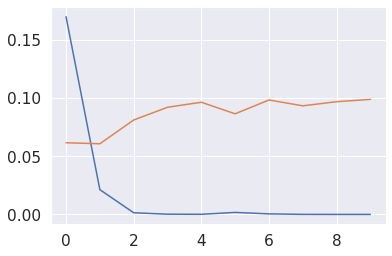

In [76]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

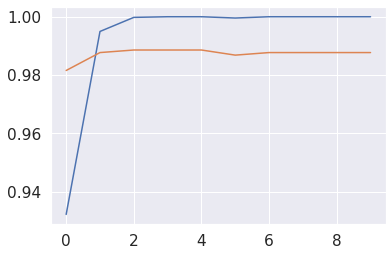

In [77]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

In [78]:
a=[]
for d in y_pred:
  if d>0.7:
    a.append(1)
  else:
    a.append(0)

In [79]:
a=np.array(a)

In [80]:
accuracy_score(a,y_test)

0.9877085162423178

Text(0.5, 1.0, 'Loss & Accuracy over time')

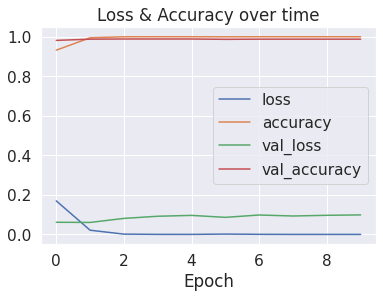

In [81]:
import matplotlib.pyplot as plt
pd.DataFrame(history.history).plot(xlabel="Epoch")
plt.title("Loss & Accuracy over time")


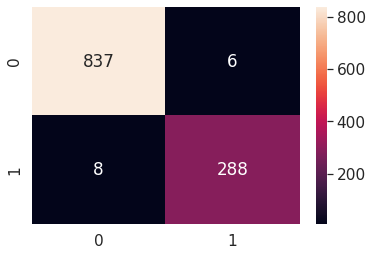

In [82]:
import sklearn
cm = sklearn.metrics.confusion_matrix(y_test, a)
sns.heatmap(cm, annot=True, fmt="d")